In [1]:
import os
import sys
import pickle
import numpy as np

import torch
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision import transforms

from PIL import Image

from model import MyModel
from utils import score, load_checkpoint, reset, count_parameters
from torchsummary import summary

In [2]:
import random
def manual_seed(seed):
    np.random.seed(seed) #1
    random.seed(seed) #2
    torch.manual_seed(seed) #3Q
    torch.cuda.manual_seed(seed) #4.1
    torch.cuda.manual_seed_all(seed) #4.2
    torch.backends.cudnn.benchmark = False #5 
    torch.backends.cudnn.deterministic = True #6

In [3]:
train_data_fp = 'train.pkl'
val_data_fp = 'val.pkl'
device = 'cuda' if torch.cuda.is_available() else 'cpu'
batch_size = 32
val_batch_size = 256
print(os.getcwd())
print(device)

/workspace/ai-toolkit/final_classifier
cuda


In [4]:
manual_seed(42)

In [5]:
from collections import Counter
with open(train_data_fp, "rb") as file:
    train_data = pickle.load(file)
    print(train_data.keys())
    train_ids = train_data['id']
    train_labels = train_data['label']
    train_paths = train_data['path']
    print(Counter(train_ids))

print(f"train data :{len(train_labels)}")


with open(val_data_fp, "rb") as file:
    val_data = pickle.load(file)
    val_ids = val_data['id']
    val_labels = val_data['label']
    val_paths = val_data['path']
    print(Counter(val_ids))

print(f"train data :{len(train_labels)}")

print(f"{val_paths}")

dict_keys(['label', 'id', 'path'])
Counter({19: 525, 84: 525, 99: 525, 50: 525, 21: 525, 16: 525, 2: 525, 79: 525, 35: 525, 12: 525, 61: 525, 92: 525, 45: 525, 59: 525, 31: 525, 67: 525, 23: 525, 60: 525, 5: 525, 6: 525, 76: 525, 37: 525, 57: 525, 100: 525, 62: 525, 75: 525, 32: 525, 1: 525, 81: 525, 38: 525, 54: 525, 56: 525, 74: 525, 73: 525, 34: 525, 27: 525, 0: 525, 55: 525, 72: 525, 64: 525, 53: 525, 91: 525, 3: 525, 36: 525, 33: 525, 26: 525, 20: 525, 11: 525, 24: 525, 63: 525, 52: 525, 80: 525, 43: 525, 14: 525, 65: 525, 13: 525, 90: 525, 88: 525, 95: 525, 69: 525, 58: 525, 89: 525, 42: 525, 94: 525, 77: 525, 28: 525, 10: 525, 30: 525, 86: 525, 87: 525, 29: 525, 98: 525, 51: 525, 40: 525, 41: 525, 15: 525, 49: 525, 8: 525, 22: 525, 97: 525, 93: 525, 9: 525, 25: 525, 68: 525, 17: 525, 7: 525, 96: 525, 82: 525, 47: 525, 83: 525, 48: 525, 39: 525, 66: 525, 18: 525, 78: 525, 46: 525, 70: 525, 71: 525, 44: 525, 85: 525, 4: 525})
train data :53025
Counter({22: 225, 0: 225, 1: 225, 37:

In [6]:
import cv2
class FoodDataset(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform
        self.ids = self.data['id']
        self.paths = self.data['path']
        self.labels = self.data['label']

    def __len__(self):
        return len(self.data['path'])

    def __getitem__(self, idx):

        sample = dict()

        img_path = self.paths[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h,w , _ = image.shape
        if h > w:
            pad_num = (h-w)
            if pad_num % 2 !=0:
                image = np.pad(image,((0,0),(pad_num//2+1,pad_num//2), (0,0)), 'constant', constant_values=0)
            else:
                image = np.pad(image,((0,0),(pad_num//2,pad_num//2), (0,0)), 'constant', constant_values=0)
        else:
            pad_num = (w-h)
            if pad_num % 2 !=0:
                image = np.pad(image,((pad_num//2+1,pad_num//2), (0,0), (0,0)), 'constant', constant_values=0)
            else:
                image = np.pad(image,((pad_num//2,pad_num//2), (0,0), (0,0)), 'constant', constant_values=0)
        
        if self.transform:
            image = self.transform(image)


        sample['img'] = image
        sample['id'] = self.ids[idx]
        sample['label'] = self.labels[idx]

        return sample


class TestDataset(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform
        self.ids = self.data['id']
        self.paths = self.data['path']
        self.labels = self.data['label']

    def __len__(self):
        return len(self.data['path'])

    def __getitem__(self, idx):

        sample = dict()

        img_path = self.paths[idx]

        image = Image.open(img_path)

        if self.transform:
            image = self.transform(image)


        sample['img'] = image
        sample['id'] = self.ids[idx]
        sample['label'] = self.labels[idx]

        return sample

In [7]:
# train_transforms = transforms.Compose(
#     [
#         # transforms.RandomApply([

#         #     transforms.RandomAutocontrast(),
#         #     transforms.RandomRotation(30),
#         #     # transforms.RandomHorizontalFlip(),
#         #     # transforms.RandomAutocontrast(),
#         #     transforms.GaussianBlur(3),
#         #     transforms.RandomResizedCrop((28,28),(0.8,0.8)),
#         # ], p=0.5),
#         transforms.Resize(max_size=256),
#         # transforms.RandomRotation(30),
#         transforms.ToTensor(),
#         transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
#         # transforms.RandomErasing(scale=(0.02,0.2))
#     ]
# )

train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((256,256)),
    transforms.RandomCrop((256,256),padding=16),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    # saturation 채도, hue 색조
    # A.ColorJitter(brightness=[1,1.2],saturation=0.2, hue=0.1),
    transforms.ColorJitter(brightness=0.2,saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    transforms.RandomErasing(scale=(0.02,0.2)),

])

with open(train_data_fp, 'rb') as file:
    train_data = pickle.load(file)

train_dataset = FoodDataset(train_data, transform=train_transforms)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4, persistent_workers=True, pin_memory=True)


val_transforms = transforms.Compose([
    # transforms.Resize((256,256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

with open(val_data_fp, 'rb') as file:
    val_data = pickle.load(file)

val_dataset = TestDataset(val_data, transform=val_transforms)
val_loader = DataLoader(val_dataset, batch_size=val_batch_size, shuffle=False, num_workers=4, persistent_workers=True, pin_memory=True)
print(len(train_dataset), len(val_dataset))
print(train_dataset.paths[0], len(val_dataset))

53025 22725
train/data_1.jpg 22725


In [8]:
samples= next(iter(train_loader))
print(samples['id'].shape)

print(samples['img'][0].shape)
samples= next(iter(val_loader))
print(samples['id'].shape)

print(samples['img'][0].shape)



torch.Size([32])
torch.Size([3, 256, 256])
torch.Size([256])
torch.Size([3, 256, 256])


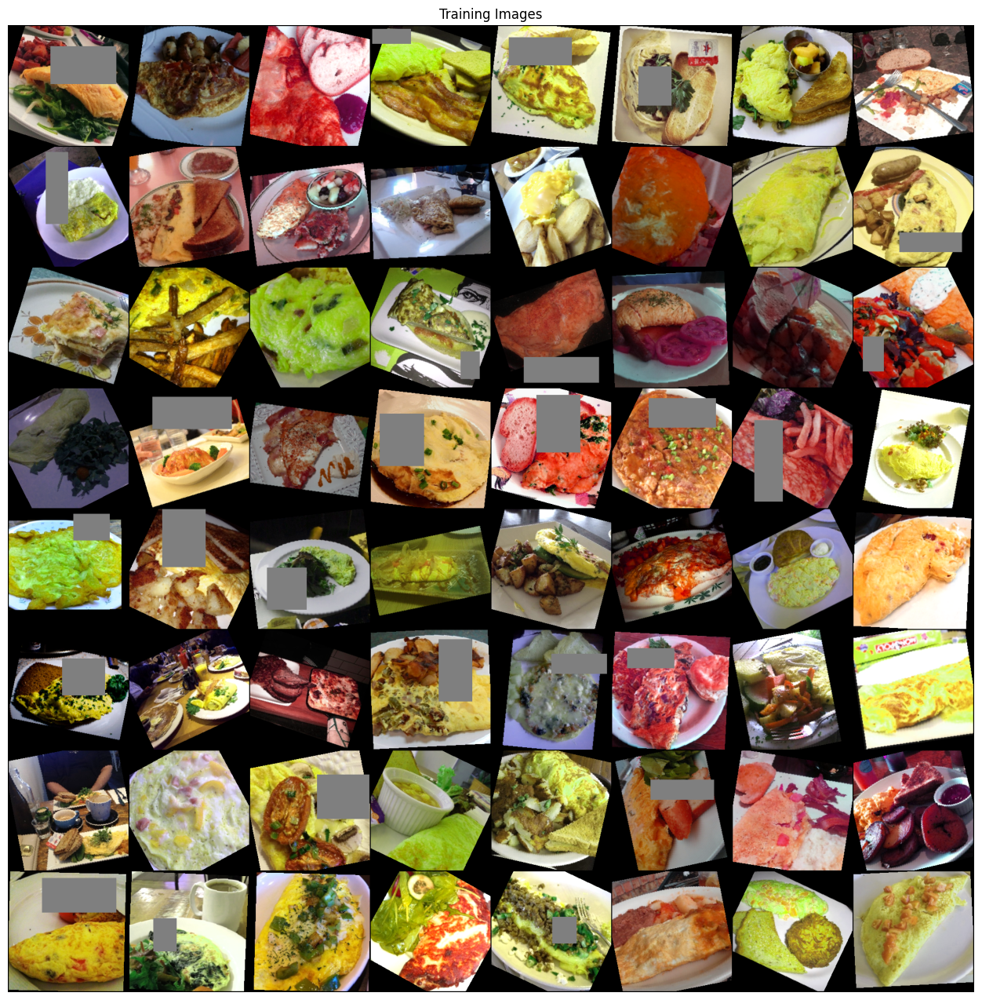

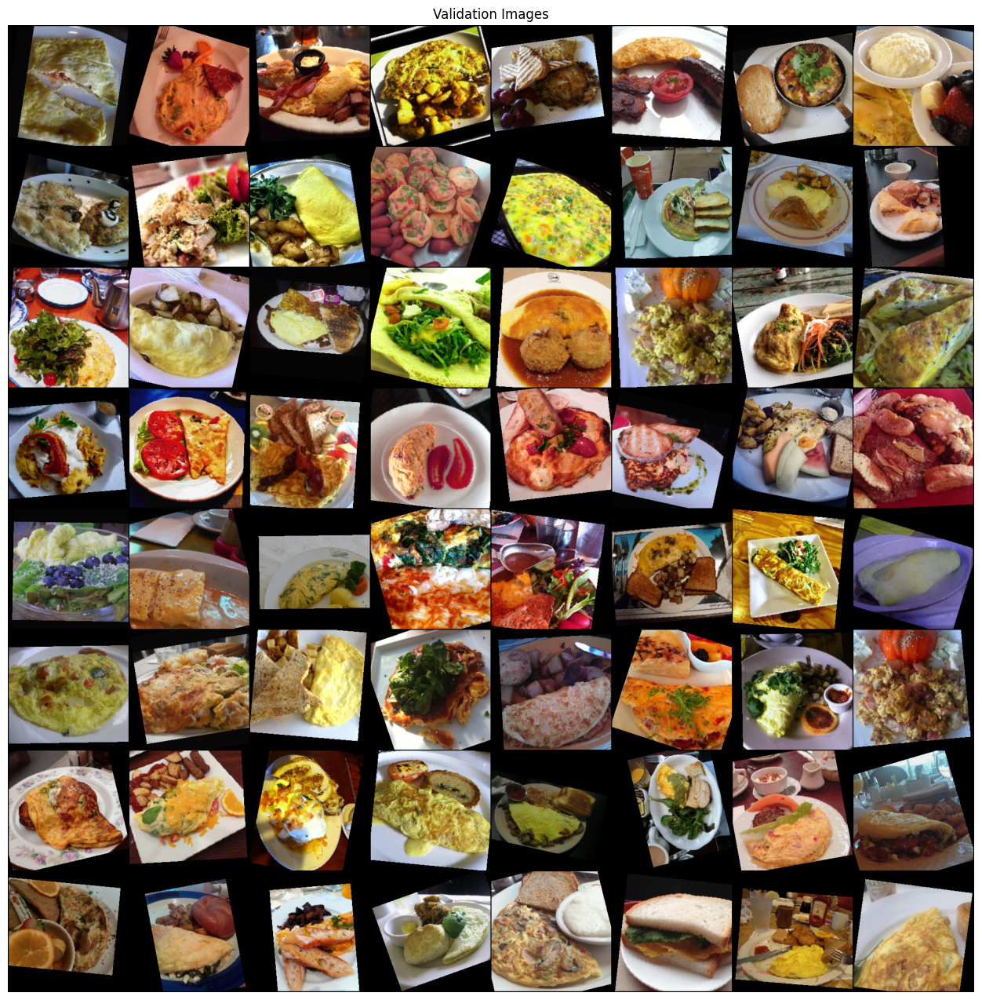

In [9]:
import matplotlib.pyplot as plt
from torchvision.transforms.functional import normalize
import torchvision.utils as vutils
train_imgs = []

for i in range(len(train_dataset)):
    sample = train_dataset.__getitem__(i)
    if sample['id']==67:
        img = sample['img']
        train_imgs.append(img)
    if len(train_imgs)== 64:
        train_imgs = torch.stack(train_imgs, dim=0)
        break
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(train_imgs.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# samples= next(iter(val_loader))
val_imgs = []

for i in range(len(val_dataset)):
    sample = val_dataset.__getitem__(i)
    if sample['id']==67:
        img = sample['img']
        val_imgs.append(img)
    if len(val_imgs)== 64:
        val_imgs = torch.stack(val_imgs, dim=0)
        break
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Validation Images")
plt.imshow(np.transpose(vutils.make_grid(val_imgs.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

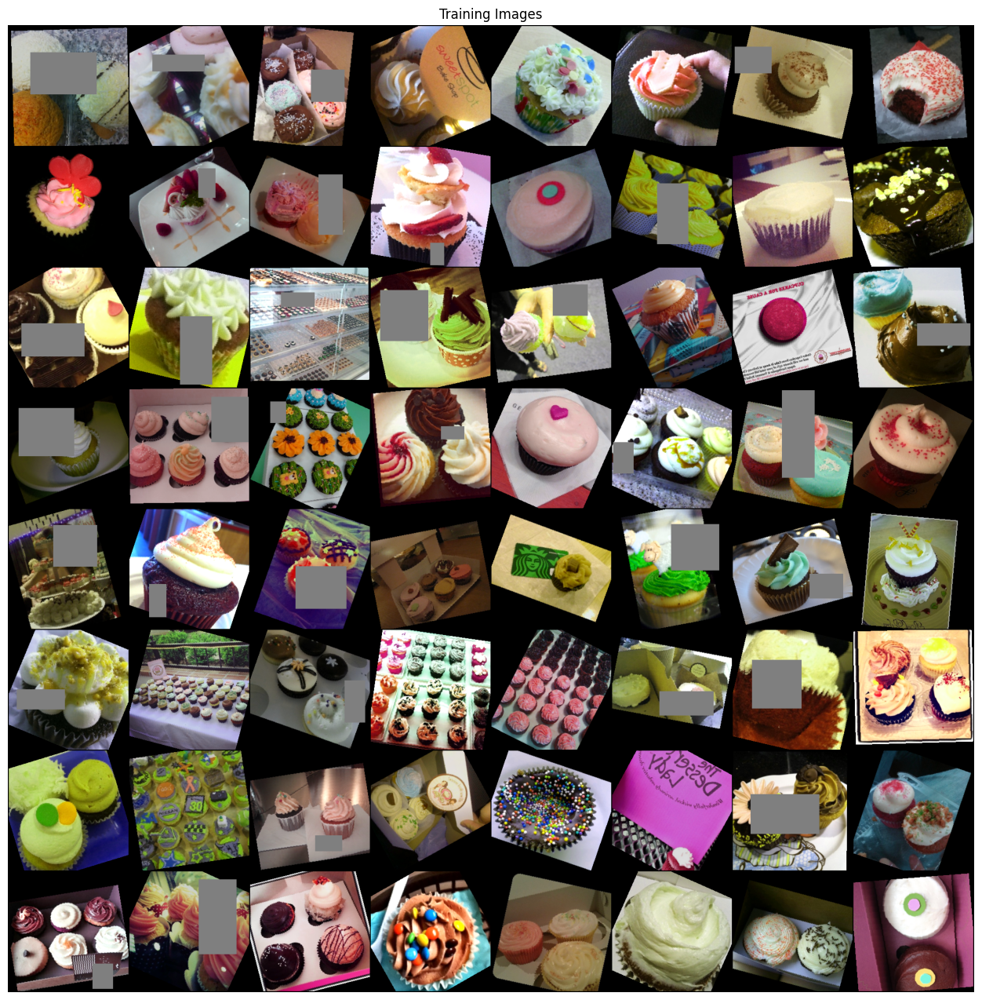

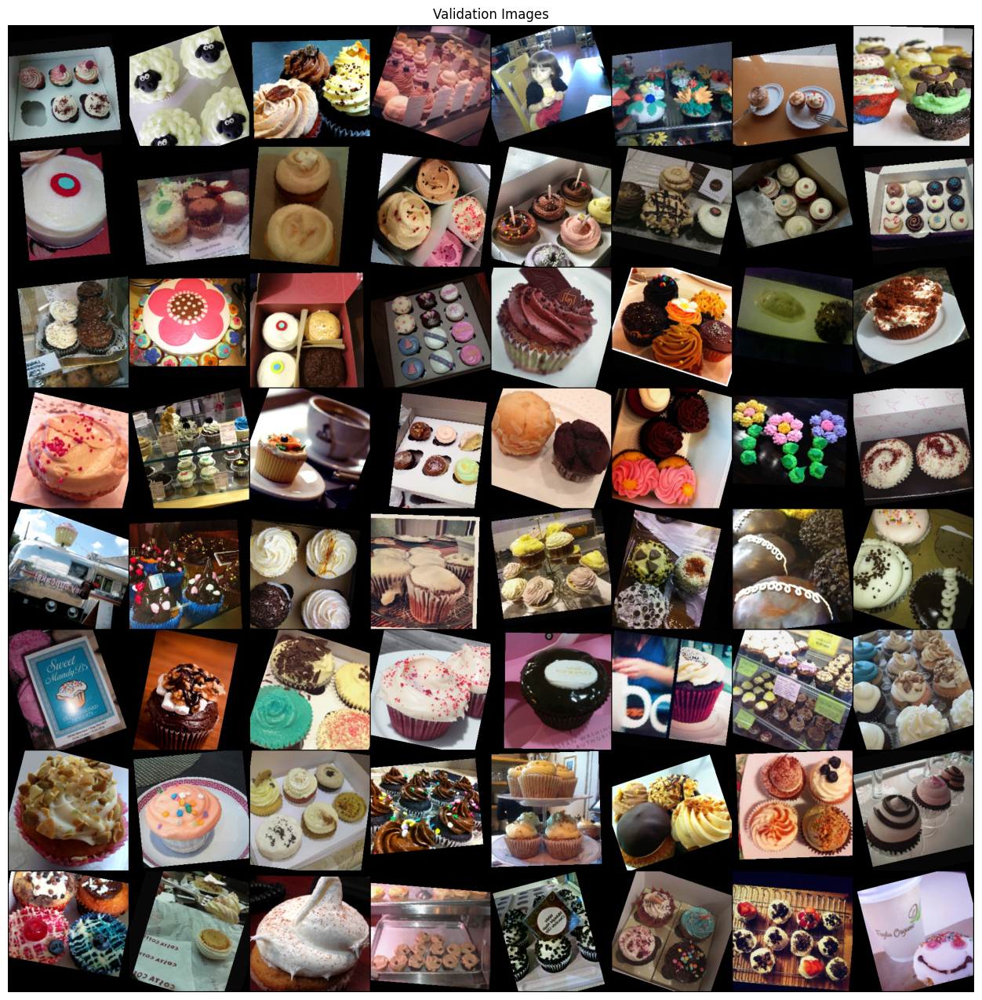

In [10]:
train_imgs = []
num_class = 3
for i in range(len(train_dataset)):
    sample = train_dataset.__getitem__(i)
    if sample['id']==29:
        img = sample['img']
        train_imgs.append(img)
    if len(train_imgs)== 64:
        train_imgs = torch.stack(train_imgs, dim=0)
        break
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(train_imgs.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# samples= next(iter(val_loader))
val_imgs = []

for i in range(len(val_dataset)):
    sample = val_dataset.__getitem__(i)
    if sample['id']==29:
        img = sample['img']
        val_imgs.append(img)
    if len(val_imgs)== 64:
        val_imgs = torch.stack(val_imgs, dim=0)
        break
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Validation Images")
plt.imshow(np.transpose(vutils.make_grid(val_imgs.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))



In [11]:
LR = 3e-5
EPOCHS= 20

In [12]:
model = MyModel()
print(count_parameters(model))
optimizer = torch.optim.Adam(model.parameters(), lr = LR,  weight_decay=0.005)
# optimizer = torch.optim.SGD(model.parameters(), lr = LR, momentum=0.9 ,weight_decay=0.005)
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer,mode='min',factor=0.5,patience=5)
# scheduler = None
criterion = torch.nn.CrossEntropyLoss()
summary(model,(3,256,256),device='cpu')

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


11228325
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
       BasicBlock-11           [-1, 64, 64, 64]               0
           Conv2d-12           [-1, 64, 64, 64]          36,864
      BatchNorm2d-13           [-1, 64, 64, 64]             128
             ReLU-14          

In [13]:
from tqdm.auto import tqdm

model.to(device)
best_acc = 0
for epoch in range(EPOCHS):
    running_loss = 0
    running_acc = 0
    model.train()
    train_loader = tqdm(train_loader, leave=False)

    for samples in train_loader:
        # imgs = torch.tensor(samples['img']).to(device)
        # labels = torch.tensor(samples['id']).to(device)
        imgs = samples['img'].to(device)
        labels = samples['id'].to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        preds = torch.argmax(outputs, dim=-1)
        running_loss += loss.item()
        running_acc += (preds==labels).sum().item()
    running_acc = running_acc /len(train_dataset)*100
    print(f"{epoch+1} training_loss : {running_loss /len(train_loader):.2f} acc :{running_acc:.2f}%, lr = {optimizer.param_groups[0]['lr']}")

    # val
    model.eval()
    val_loss = 0
    val_acc = 0
    with torch.no_grad():
        for samples in tqdm(val_loader, leave=False):
            imgs = samples['img'].to(device)
            labels = samples['id'].to(device)
            
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            preds = torch.argmax(outputs, dim=-1)

            val_loss += loss.item()
            val_acc += (preds==labels).sum().item()
    val_acc = val_acc/ len(val_dataset)*100
    print(f"\tval_loss : {val_loss /len(val_loader):.2f} acc :{val_acc:.2f}%")
    if best_acc < val_acc:
        best_acc = val_acc
        checkpoint = {
            'model' : MyModel(),
            'model_state_dict' : model.state_dict(),
        }
        torch.save(checkpoint, './check/checkpoint.pth')
        print(f"save best acc {best_acc:.2f}")



/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
  0%|          | 0/1658 [00:00<?, ?it/s]

1 training_loss : 3.16 acc :31.52%, lr = 3e-05


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


	val_loss : 2.10 acc :51.10%
save best acc 51.10


2 training_loss : 2.05 acc :52.72%, lr = 3e-05


	val_loss : 1.66 acc :58.99%
save best acc 58.99


3 training_loss : 1.69 acc :59.67%, lr = 3e-05


	val_loss : 1.44 acc :63.95%
save best acc 63.95


4 training_loss : 1.50 acc :63.45%, lr = 3e-05


	val_loss : 1.39 acc :64.66%
save best acc 64.66


5 training_loss : 1.37 acc :66.47%, lr = 3e-05


	val_loss : 1.30 acc :67.06%
save best acc 67.06


6 training_loss : 1.28 acc :68.45%, lr = 3e-05


	val_loss : 1.29 acc :66.75%


7 training_loss : 1.20 acc :70.42%, lr = 3e-05


	val_loss : 1.25 acc :68.47%
save best acc 68.47


8 training_loss : 1.14 acc :71.69%, lr = 3e-05


	val_loss : 1.26 acc :67.72%


9 training_loss : 1.08 acc :73.32%, lr = 3e-05


	val_loss : 1.21 acc :68.85%
save best acc 68.85


10 training_loss : 1.04 acc :74.50%, lr = 3e-05


	val_loss : 1.23 acc :68.39%


11 training_loss : 1.00 acc :75.44%, lr = 3e-05


	val_loss : 1.20 acc :69.37%
save best acc 69.37


12 training_loss : 0.96 acc :76.50%, lr = 3e-05


	val_loss : 1.21 acc :69.07%


13 training_loss : 0.93 acc :77.38%, lr = 3e-05


	val_loss : 1.20 acc :70.04%
save best acc 70.04


14 training_loss : 0.90 acc :78.17%, lr = 3e-05


	val_loss : 1.20 acc :69.54%


15 training_loss : 0.88 acc :78.62%, lr = 3e-05


	val_loss : 1.18 acc :70.13%
save best acc 70.13


16 training_loss : 0.86 acc :79.58%, lr = 3e-05


	val_loss : 1.20 acc :69.83%


17 training_loss : 0.84 acc :80.22%, lr = 3e-05


	val_loss : 1.23 acc :69.65%


18 training_loss : 0.83 acc :80.56%, lr = 3e-05


	val_loss : 1.19 acc :70.08%


19 training_loss : 0.80 acc :81.32%, lr = 3e-05


	val_loss : 1.19 acc :70.20%
save best acc 70.20


20 training_loss : 0.80 acc :81.48%, lr = 3e-05


	val_loss : 1.22 acc :69.97%


In [14]:
from sklearn.metrics import confusion_matrix, classification_report 
import seaborn as sns
# val
model.eval()
val_loss = 0
val_acc = 0
predictions = []
with torch.no_grad():
    for samples in tqdm(val_loader, leave=False):
        imgs = samples['img'].to(device)
        labels = samples['id'].to(device)
        
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        preds = torch.argmax(outputs, dim=-1)
        predictions.extend(preds.view(-1).detach().cpu().tolist())

cm = confusion_matrix(val_dataset.ids, predictions)
clr = classification_report(val_dataset.ids, predictions, zero_division=0)

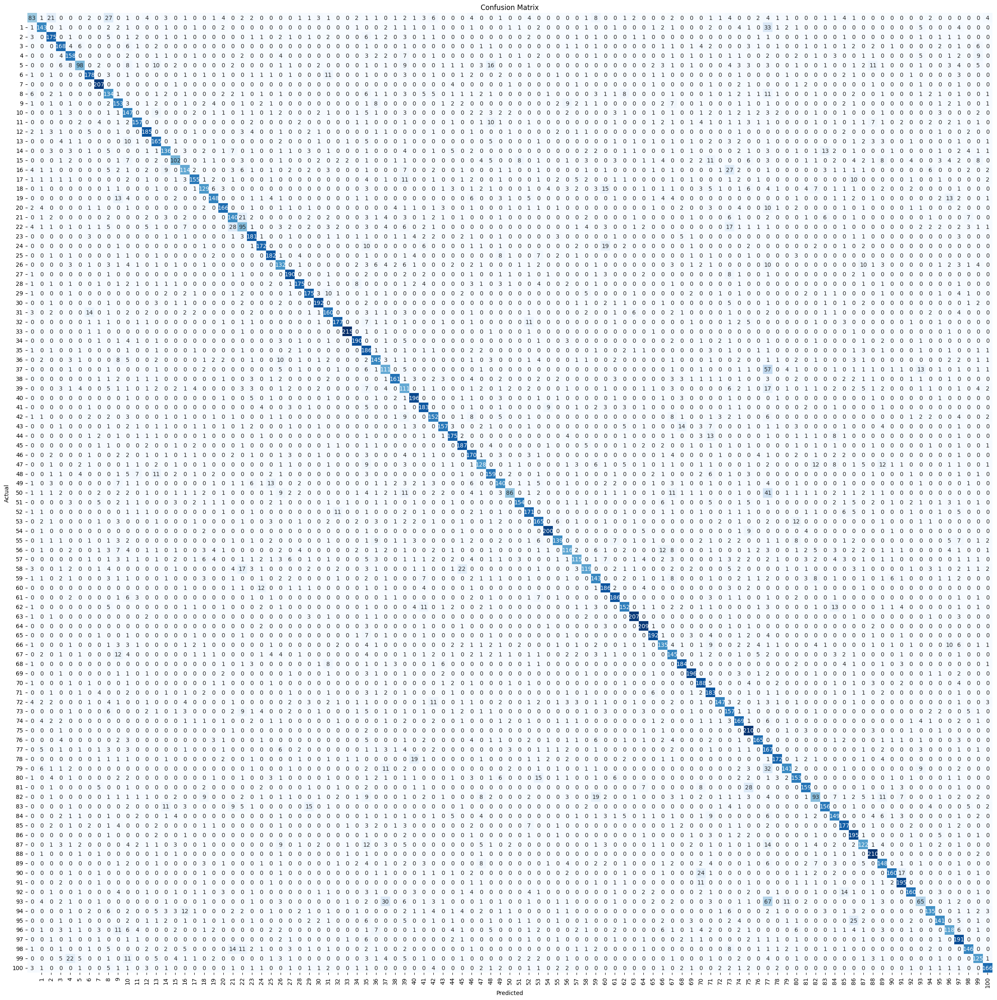

In [15]:
plt.figure(figsize=(30, 30))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
plt.xticks(ticks=np.arange(1,101) + 0.5, labels=range(1,101), rotation=90)
plt.yticks(ticks=np.arange(1,101) + 0.5, labels=range(1,101), rotation=0)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()